# Flower Image Classification

- tensorflow tf_flowers 데이터
- dataset size: 221.83 MiB

## Library

In [118]:
import warnings
warnings.filterwarnings("ignore")
import tensorflow as tf
print(tf.__version__)
import tensorflow_datasets as tfds
print(tfds.__version__)
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
from tensorflow.keras.preprocessing.image import load_img, img_to_array

2.2.0
3.2.1


## Import Data
- Height, Weight, rbg, label shape
- 각 이미지 사이즈 다르므로 None으로 나타남

In [119]:
#each train,validation,test dataset
(raw_train,raw_validation,raw_test),metadata=tfds.load(
    'tf_flowers',
    split=['train[:80%]','train[80%:90%]','train[90%:]'],
    with_info=True,
    shuffle_files=True,
    as_supervised=True
)
# check the data
print(raw_train)
print(raw_validation)
print(raw_test)

<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


## Check the data
- 딱 봐도 사이즈 동일하지 않음.|
- label비율 보면 dandelion이 가장 많음.

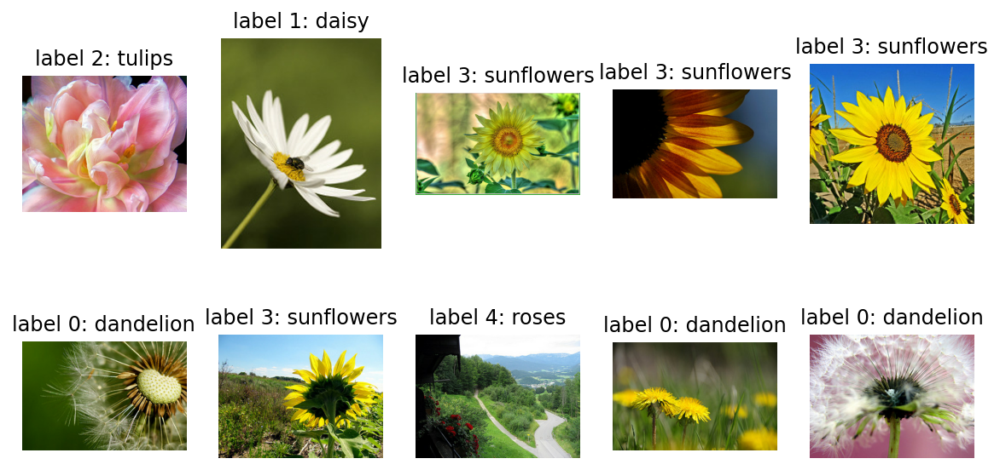

In [120]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [6]:
flower_label=[]
for idx, (image, label) in enumerate(raw_train.take(3000)):
    flower_label.append(get_label_name(label))
    
pd.DataFrame(flower_label)[0].value_counts()

dandelion     739
tulips        613
sunflowers    561
daisy         513
roses         510
Name: 0, dtype: int64

## Image Size 조정
- 160 x 160 pixels
- scale -1 ~ 1

In [121]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [122]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

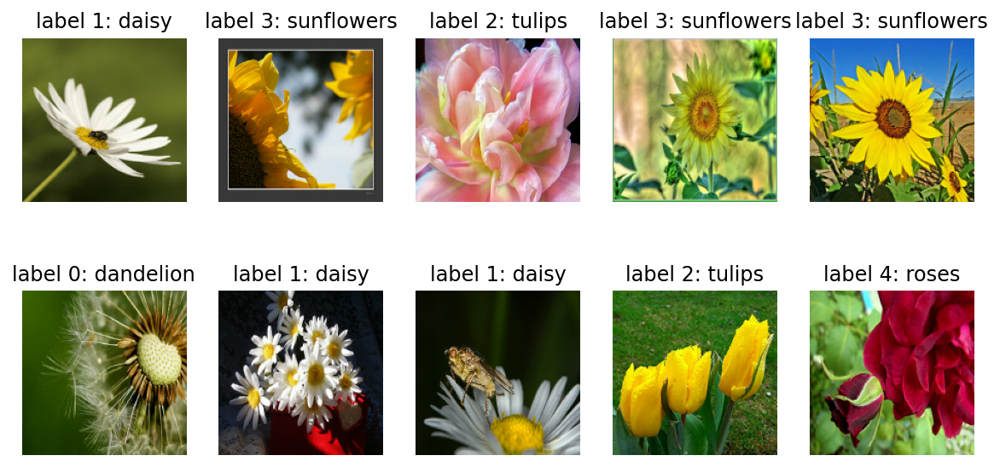

In [123]:
# 이미지 다시 확인
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

## Model 만들기
- Conv2D, MaxPooling2D, Flatten, Dense layer 사용

In [167]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [168]:
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_288 (Conv2D)          (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_289 (Conv2D)          (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_290 (Conv2D)          (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 20, 20, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 25600)           

## Compile
- optimizer: 어떻게 학습?
- loss: 모델 학습 방향 (작을 수록 좋음)
- metrics: accuracy, precision, recall

In [169]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

- batch size: 한 스텝에 학습시킬 데이터 갯수
- shuffle buffer size: 학습 데이터 적절히 섞을 수 있게
- train batch: 전체 데이터에서 batch size만큼 랜덤으로 뽑아라

In [10]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [11]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [172]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/12 [==============================] - 0s 10ms/step - loss: 1.6103 - accuracy: 0.2289
initial loss: 1.61
initial accuracy: 0.23


In [173]:
EPOCHS = 20
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 3s 27ms/step - loss: 1.3829 - accuracy: 0.4118 - val_loss: 1.1179 - val_accuracy: 0.5368
Epoch 2/20
92/92 [==============================] - 2s 27ms/step - loss: 1.1077 - accuracy: 0.5433 - val_loss: 1.0610 - val_accuracy: 0.5886
Epoch 3/20
92/92 [==============================] - 2s 27ms/step - loss: 0.9908 - accuracy: 0.6052 - val_loss: 0.9633 - val_accuracy: 0.6431
Epoch 4/20
92/92 [==============================] - 2s 27ms/step - loss: 0.8978 - accuracy: 0.6580 - val_loss: 0.9603 - val_accuracy: 0.6213
Epoch 5/20
92/92 [==============================] - 3s 27ms/step - loss: 0.8170 - accuracy: 0.6870 - val_loss: 1.0004 - val_accuracy: 0.6213
Epoch 6/20
92/92 [==============================] - 3s 27ms/step - loss: 0.7304 - accuracy: 0.7234 - val_loss: 0.9122 - val_accuracy: 0.6649
Epoch 7/20
92/92 [==============================] - 3s 28ms/step - loss: 0.6688 - accuracy: 0.7565 - val_loss: 0.9582 - val_accuracy: 0.6240
Epoch 8/20
92

- 아래 그래프를 보면 train은 잘됐는데 validation accuracy가 너무 낮음. overfitting일어나고 있다는 뜻. 다른 모델을 사용해야 함.

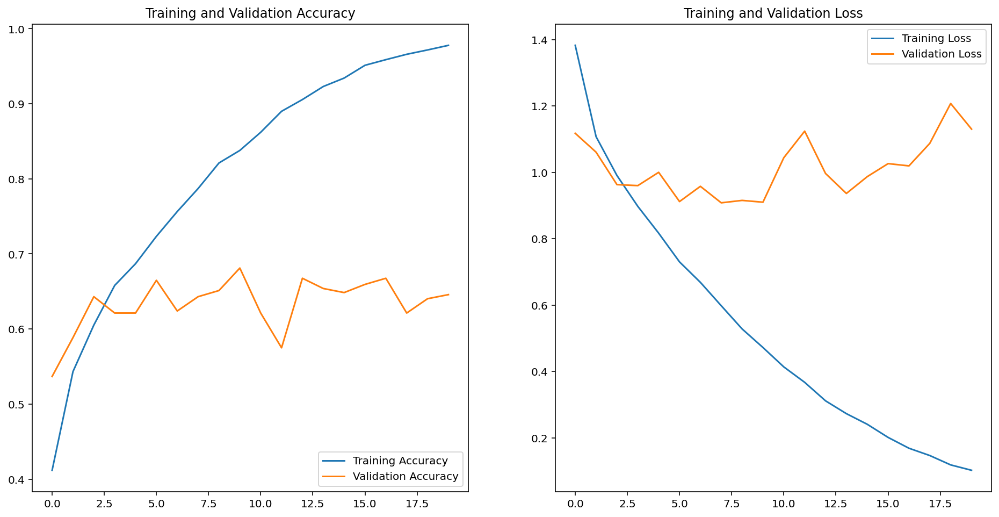

In [174]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Model 예측값 확인

In [175]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.45758438e-05, 9.08910879e-04, 3.12733740e-01, 6.52589733e-05,
        6.86197519e-01],
       [9.98139143e-01, 1.79647468e-03, 5.51691701e-05, 2.53711843e-08,
        9.22069557e-06],
       [6.34981871e-01, 6.48201853e-02, 1.89523458e-01, 5.43290563e-03,
        1.05241604e-01],
       [9.99954343e-01, 4.24619539e-05, 3.40858634e-07, 1.73718000e-08,
        2.87769467e-06],
       [7.13241458e-01, 3.83099988e-02, 2.03498211e-02, 1.30430248e-03,
        2.26794526e-01],
       [7.67328384e-05, 1.75704733e-02, 9.64617848e-01, 1.02888283e-04,
        1.76320598e-02],
       [3.85175586e-01, 2.56206483e-01, 1.33815661e-01, 7.48451392e-04,
        2.24053770e-01],
       [7.23673999e-01, 1.12587698e-01, 1.31347075e-01, 4.25103703e-04,
        3.19661945e-02],
       [1.13453382e-06, 2.14304018e-04, 8.57020378e-01, 9.10879226e-06,
        1.42755017e-01],
       [6.54837251e-01, 6.00563089e-06, 3.32683325e-04, 3.44816417e-01,
        7.61456204e-06],
       [3.61440331e-02, 2.2323

In [176]:
# 라벨로 변환한 값
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 3, 4, 0, 3,
       3, 0, 1, 2, 2, 4, 2, 1, 0, 0])

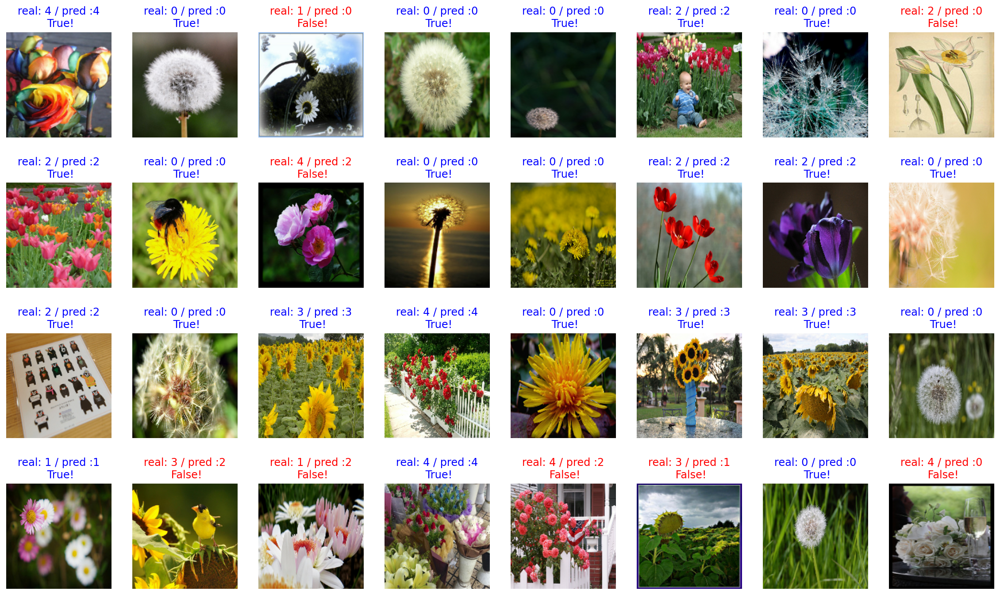

In [177]:
# 시각화하여 확인
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [178]:
# 정답을 맞춘 개수 확인
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = prediction == label
    if correct:
      count += 1

print(count / 32 * 100)    # 약 70% 내외

75.0


## 전이 학습 적용

- 윗 모델은 오버피팅이 일어나고 있기 때문에 다른 모델을 찾는 것이 좋음.
- 이번에는 기존에 만들어진 모델의 변형을 통해 accuracy를 높여보려 함.
- VGG19 accuracy -> 81.25%
- InceptionV3 -> 82.3%
- Xception
- ResNet150 -> 88.0%
- VGG16

### Inception 모델 사용해보기

In [124]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model inceptionv3
inception_model = tf.keras.applications.InceptionV3(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

### Resnet 153 V3 모델 사용

In [125]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model resnet152v2
resnet_model = tf.keras.applications.ResNet152V2(input_shape=IMG_SHAPE,
                                             include_top=False,
                                             weights='imagenet')

### shape 확인

In [126]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [127]:
# height, weight 작아지고, channel이 커짐
feature_batch = inception_model(image_batch)
feature_batch.shape

TensorShape([32, 3, 3, 2048])

In [128]:
# height, weight 작아지고, channel이 커짐
feature_batch = resnet_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 2048])

### Inception V3 모델 구조 확인

In [129]:
inception_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d_376 (Conv2D)             (None, 79, 79, 32)   864         input_11[0][0]                   
__________________________________________________________________________________________________
batch_normalization_376 (BatchN (None, 79, 79, 32)   96          conv2d_376[0][0]                 
__________________________________________________________________________________________________
activation_376 (Activation)     (None, 79, 79, 32)   0           batch_normalization_376[0][0]    
_______________________________________________________________________________________

### Resnet 153 V3 모델 구조 확인

In [130]:
resnet_model.summary()

Model: "resnet152v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 166, 166, 3)  0           input_12[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 80, 80, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 82, 82, 64)   0           conv1_conv[0][0]                 
________________________________________________________________________________________

### Flatten

In [131]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2048)


### Dense Layer 붙이기

In [132]:
# Dense Layer 붙이기
dense_layer = tf.keras.layers.Dense(2048, activation='relu')
dropout_layer = tf.keras.layers.Dropout(.2)
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [133]:
# base model학습시키지 않으므로 false
base_model.trainable = False

### 모델 구성

In [134]:
model_inception = tf.keras.Sequential([
    inception_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])

In [135]:
model_resnet = tf.keras.Sequential([
    resnet_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])

In [136]:
model_inception.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 3, 3, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d_6 ( (None, 2048)              0         
_________________________________________________________________
dense_20 (Dense)             (None, 2048)              4196352   
_________________________________________________________________
dense_21 (Dense)             (None, 5)                 10245     
Total params: 26,009,381
Trainable params: 25,974,949
Non-trainable params: 34,432
_________________________________________________________________


In [137]:
model_resnet.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet152v2 (Model)          (None, 5, 5, 2048)        58331648  
_________________________________________________________________
global_average_pooling2d_6 ( (None, 2048)              0         
_________________________________________________________________
dense_20 (Dense)             (None, 2048)              4196352   
_________________________________________________________________
dense_21 (Dense)             (None, 5)                 10245     
Total params: 62,538,245
Trainable params: 62,394,501
Non-trainable params: 143,744
_________________________________________________________________


### Model Compile

In [138]:
base_learning_rate = 0.0001
model_resnet.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [139]:
base_learning_rate = 0.0001
model_inception.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [140]:
# loss accuracy확인
validation_steps=20
loss0, accuracy0 = model_inception.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 2.3436 - accuracy: 0.2273WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


12/20 [=================>............] - 0s 26ms/step - loss: 2.3637 - accuracy: 0.2262
initial loss: 2.36
initial accuracy: 0.23


In [151]:
# loss accuracy확인
validation_steps=20
loss0, accuracy0 = model_resnet.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 2.5373 - accuracy: 0.1790WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


12/20 [=================>............] - 1s 78ms/step - loss: 2.5316 - accuracy: 0.1744
initial loss: 2.53
initial accuracy: 0.17


In [141]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model_inception.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 10s 110ms/step - loss: 0.6760 - accuracy: 0.7476 - val_loss: 0.9169 - val_accuracy: 0.8311
Epoch 2/5
92/92 [==============================] - 10s 111ms/step - loss: 0.2298 - accuracy: 0.9275 - val_loss: 0.6896 - val_accuracy: 0.8638
Epoch 3/5
92/92 [==============================] - 10s 111ms/step - loss: 0.1148 - accuracy: 0.9612 - val_loss: 0.7670 - val_accuracy: 0.8638
Epoch 4/5
92/92 [==============================] - 10s 111ms/step - loss: 0.0964 - accuracy: 0.9680 - val_loss: 0.9324 - val_accuracy: 0.8692
Epoch 5/5
92/92 [==============================] - 10s 110ms/step - loss: 0.0778 - accuracy: 0.9789 - val_loss: 0.7475 - val_accuracy: 0.9046


In [152]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history_resnet = model_resnet.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 112s 1s/step - loss: 0.5740 - accuracy: 0.7970 - val_loss: 0.8171 - val_accuracy: 0.8719
Epoch 2/5
92/92 [==============================] - 29s 317ms/step - loss: 0.1730 - accuracy: 0.9428 - val_loss: 1.0304 - val_accuracy: 0.8774
Epoch 3/5
92/92 [==============================] - 29s 320ms/step - loss: 0.1108 - accuracy: 0.9653 - val_loss: 1.4058 - val_accuracy: 0.8937
Epoch 4/5
92/92 [==============================] - 29s 321ms/step - loss: 0.1005 - accuracy: 0.9639 - val_loss: 1.5138 - val_accuracy: 0.8801
Epoch 5/5
92/92 [==============================] - 30s 322ms/step - loss: 0.0896 - accuracy: 0.9772 - val_loss: 5.4211 - val_accuracy: 0.8365


### 학습과정 그래프로 확인 (Resnet V3)

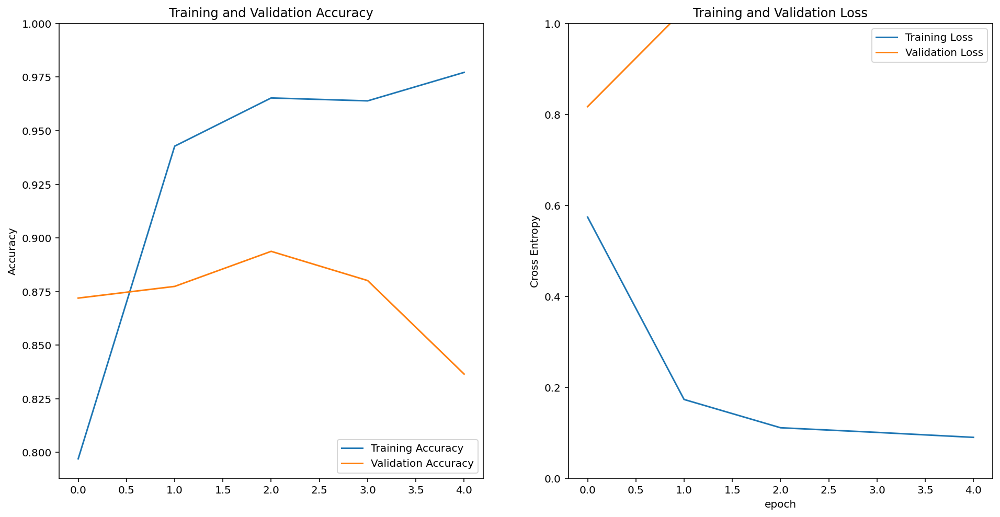

In [153]:
# 학습 과정 그래프로 확인
acc = history_resnet.history['accuracy']
val_acc = history_resnet.history['val_accuracy']

loss = history_resnet.history['loss']
val_loss = history_resnet.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### Inception V3

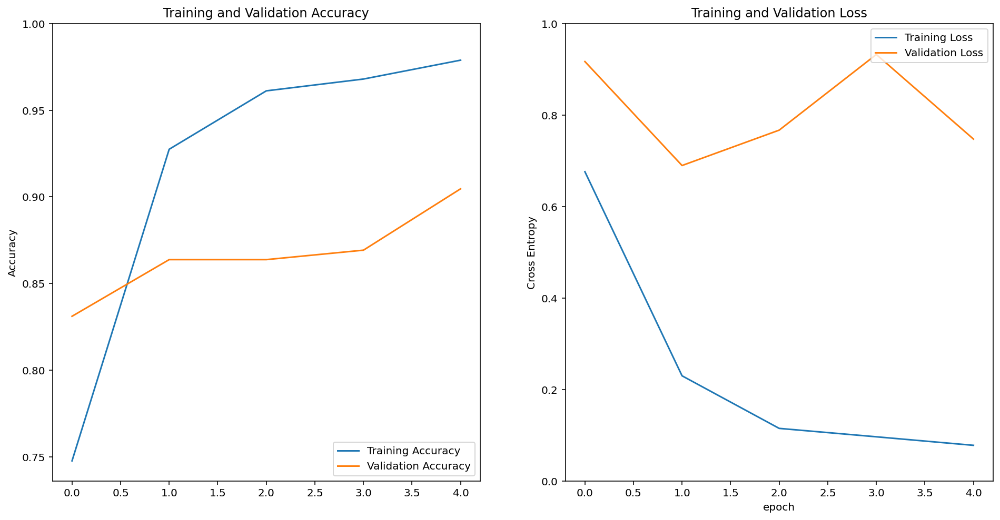

In [142]:
# 학습 과정 그래프로 확인
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### 예측 결과 확인

In [147]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model_inception.predict(image_batch)
    pass

predictions

array([[1.00000000e+00, 2.37603204e-13, 2.29612827e-19, 2.72216548e-13,
        2.52696301e-13],
       [1.00000000e+00, 9.15472587e-10, 5.60918360e-19, 5.53207594e-16,
        8.46418848e-17],
       [2.98015952e-12, 1.94606213e-13, 1.28655418e-04, 2.74112608e-11,
        9.99871373e-01],
       [4.25729744e-16, 1.00000000e+00, 1.73989154e-20, 3.42720341e-19,
        2.19324187e-16],
       [1.00000000e+00, 3.39782645e-13, 5.63198534e-23, 3.91390367e-17,
        1.64422165e-18],
       [9.01706924e-04, 1.92084012e-03, 9.88859653e-01, 2.12900468e-05,
        8.29645991e-03],
       [1.00000000e+00, 1.56440316e-18, 4.35694101e-32, 6.68878385e-31,
        1.20483983e-25],
       [9.08172126e-07, 1.97321824e-05, 9.99973297e-01, 3.63746699e-09,
        6.09868312e-06],
       [1.68376971e-07, 4.13583708e-04, 9.99194205e-01, 3.25818723e-06,
        3.88796150e-04],
       [1.00000000e+00, 3.93639716e-15, 2.91754944e-29, 4.10860922e-25,
        5.27170993e-20],
       [1.21080235e-09, 1.8586

In [148]:
# 라벨로 변환
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 4, 1, 0, 2, 0, 2, 2, 0, 4, 0, 4, 0, 0, 0, 2, 1, 3, 0, 2, 3,
       3, 3, 0, 1, 3, 1, 4, 4, 0, 4])

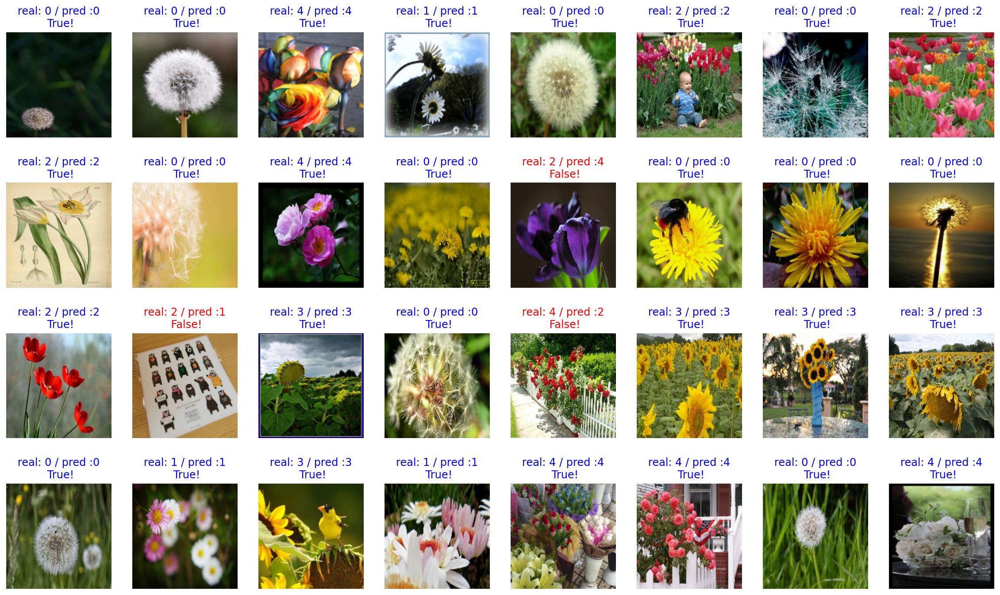

In [149]:
# 확인하기
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

### Inception 정확도 확인

In [150]:
# 정확도 확인
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

90.625


## Conclusion
- accuracy는 높아졌지만 training accuracy와 validation accuracy 사이에 갭이 여전히 존재. 나중에 모델을 바꾸거나 개선하며 overfitting 문제 해결하는 것이 좋을 것 같음.
- Inception을 사용해서 epoch을 좀 더 늘리는 방식을 사용하면 좋을 것 같음.
- 상대적으로 이미지 갯수가 적어서 이미지 갯수를 늘려서 학습 테스트 하는 방법도 있음.